## Lab6-Assignment Topic classification Using transformer-based models

Use the same training, development, and test partitions of the the 20 newsgroups text dataset as in Lab6.4-Topic-classification-BERT.ipynb 

* Fine-tune and examine the performance of another transformer-based pretrained language models, e.g., RoBERTa, XLNet

* Compare the performance of this model to the results achieved in Lab6.4-Topic-classification-BERT.ipynb and to a conventional machine learning approach (e.g., SVM, Naive Bayes) using bag-of-words or other engineered features of your choice. Describe the differences in performance in terms of Precision, Recall, and F1-score evaluation metrics.

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import sklearn
from sklearn.metrics import classification_report
from simpletransformers.classification import ClassificationModel, ClassificationArgs
import matplotlib.pyplot as plt 
import seaborn as sn 

In [2]:
from sklearn.datasets import fetch_20newsgroups

# load only a sub-selection of the categories (4 in our case)
categories = ['alt.atheism', 'comp.graphics', 'sci.med', 'sci.space'] 

# remove the headers, footers and quotes (to avoid overfitting)
newsgroups_train = fetch_20newsgroups(subset='train', remove=('headers', 'footers', 'quotes'), categories=categories, random_state=42)
newsgroups_test = fetch_20newsgroups(subset='test', remove=('headers', 'footers', 'quotes'), categories=categories, random_state=42)

In [3]:
train = pd.DataFrame({'text': newsgroups_train.data, 'labels': newsgroups_train.target})

In [4]:
test = pd.DataFrame({'text': newsgroups_test.data, 'labels': newsgroups_test.target})

In [5]:
from sklearn.model_selection import train_test_split

train, dev = train_test_split(train, test_size=0.1, random_state=0, 
                               stratify=train[['labels']])

In [6]:
# Model configuration # https://simpletransformers.ai/docs/usage/#configuring-a-simple-transformers-model 
model_args = ClassificationArgs()

model_args.overwrite_output_dir=True # overwrite existing saved models in the same directory
model_args.evaluate_during_training=True # to perform evaluation while training the model (eval data should be passed to the training method)
model_args.num_train_epochs=5 # number of epochs
model_args.train_batch_size=8 # batch size
model_args.learning_rate=4e-6 # learning rate

# Early stopping to combat overfitting: https://simpletransformers.ai/docs/tips-and-tricks/#using-early-stopping
model_args.use_early_stopping=True
model_args.early_stopping_delta=0.01 # "The improvement over best_eval_loss necessary to count as a better checkpoint"
model_args.early_stopping_metric='eval_loss'
model_args.early_stopping_metric_minimize=True
model_args.early_stopping_patience=2
model_args.evaluate_during_training_steps=18 # how often you want to run validation in terms of training steps (or batches)

In [7]:
steps_per_epoch = int(np.ceil(len(train) / float(model_args.train_batch_size)))
print('Each epoch will have {:,} steps.'.format(steps_per_epoch)) # 34 steps * 2 (validating 2 times per epoch)

Each epoch will have 64 steps.


In [9]:
model = ClassificationModel('roberta', 'roberta-base', num_labels=4, args=model_args, use_cuda=False) 

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.dense.weight', 'roberta.pooler.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.bias', 'classifi

In [10]:
_, history = model.train_model(train, eval_df=dev) 

  0%|          | 0/2025 [00:00<?, ?it/s]

C:\Users\hasan\anaconda3\lib\site-packages\transformers\optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 0 of 5:   0%|          | 0/254 [00:00<?, ?it/s]

  0%|          | 0/226 [00:00<?, ?it/s]

  0%|          | 0/226 [00:00<?, ?it/s]

  0%|          | 0/226 [00:00<?, ?it/s]

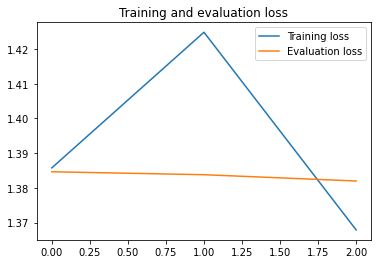

In [11]:
# Training and evaluation loss
train_loss = history['train_loss']
eval_loss = history['eval_loss']
plt.plot(train_loss, label='Training loss')
plt.plot(eval_loss, label='Evaluation loss')
plt.title('Training and evaluation loss')
plt.legend()

In [12]:
# Evaluate the model
result, model_outputs, wrong_predictions = model.eval_model(dev)
result

  0%|          | 0/226 [00:00<?, ?it/s]

Running Evaluation:   0%|          | 0/29 [00:00<?, ?it/s]

{'mcc': 0.0, 'eval_loss': 1.3819556400693696}

In [13]:
predicted, probabilities = model.predict(test.text.to_list())
test['predicted'] = predicted

  0%|          | 0/1498 [00:00<?, ?it/s]

  0%|          | 0/188 [00:00<?, ?it/s]

In [14]:
test.head(5)

,text,labels,predicted
0,\nAnd guess who's here in your place.\n\nPleas...,1,3
1,Does anyone know if any of Currier and Ives et...,1,3
2,=FLAME ON\n=\n=Reading through the posts about...,2,3
3,\nBut in this case I said I hoped that BCCI wa...,0,3
4,\nIn the kind I have made I used a Lite sour c...,2,3


In [15]:
# Result (note: your result can be different due to randomness in operations)
print(classification_report(test['labels'], test['predicted']))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       319
           1       0.00      0.00      0.00       389
           2       0.00      0.00      0.00       396
           3       0.26      1.00      0.42       394

    accuracy                           0.26      1498
   macro avg       0.07      0.25      0.10      1498
weighted avg       0.07      0.26      0.11      1498



C:\Users\hasan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hasan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hasan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


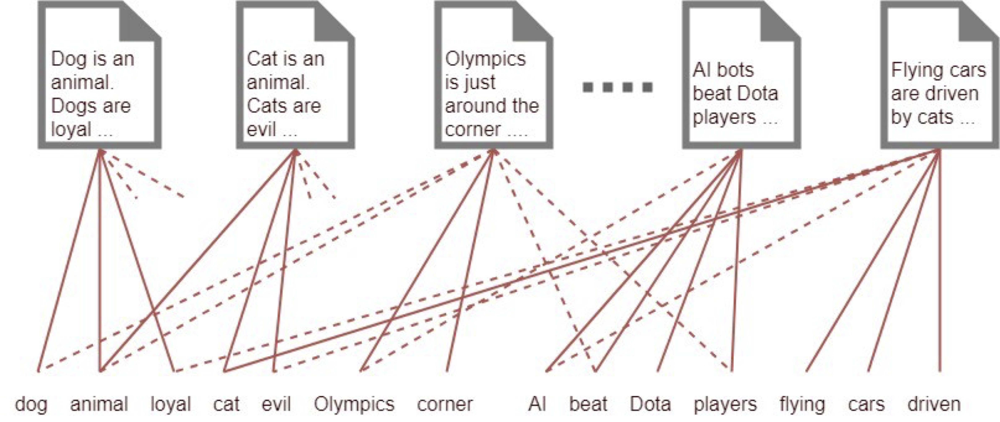

In [30]:
from IPython.display import Image, display

# If you guys want to run BERT you can hapily do it on your machines, however, these are the BERT results you can compare 
# to without running the file
display(Image(filename='C:/Users/hasan/Documents/development/tm/lab_sessions/lab6/images/topic-model1.png'))


### Comparing the performance of the BERT with a Naive Bayes classifier (with bag of words representation)

In [17]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
# We will use Multinominal Naive Bayes as our model
from sklearn.naive_bayes import MultinomialNB

In [18]:
train

,text,labels
559,I wonder how many atheists out there care to s...,0
2060,We are interested in purchasing a grayscale pr...,1
1206,"Dear Binary Newsers,\n\nI am looking for Quick...",1
1420,"Hello, I am looking for commercial software pa...",1
1210,\n\n\n Actually the most flexible way to crea...,1
...,...,...
1357,"\n(WEBSTER: myth: ""a traditional or legendar...",0
604,Nobody is saying that you shouldn't be allowe...,2
584,-> \n-> Some recent postings remind me that I ...,2
745,"Sorry, _perijoves_...I'm not used to talking t...",3


In [19]:
test

,text,labels,predicted
0,\nAnd guess who's here in your place.\n\nPleas...,1,3
1,Does anyone know if any of Currier and Ives et...,1,3
2,=FLAME ON\n=\n=Reading through the posts about...,2,3
3,\nBut in this case I said I hoped that BCCI wa...,0,3
4,\nIn the kind I have made I used a Lite sour c...,2,3
...,...,...,...
1493,\nI've got a very nice collection of historica...,2,3
1494,[ stuff deleted ]\n\nThe French SPOT is an exa...,3,3
1495,Idea for repair of satellites:\n\nWarning I am...,3,3
1496,"Once again, this posting has been delayed for ...",0,3


In [20]:
total_df = train.append(test, ignore_index=True)
print(total_df)

                                                   text  labels  predicted
0     I wonder how many atheists out there care to s...       0        NaN
1     We are interested in purchasing a grayscale pr...       1        NaN
2     Dear Binary Newsers,\n\nI am looking for Quick...       1        NaN
3     Hello, I am looking for commercial software pa...       1        NaN
4     \n\n\n  Actually the most flexible way to crea...       1        NaN
...                                                 ...     ...        ...
3518  \nI've got a very nice collection of historica...       2        3.0
3519  [ stuff deleted ]\n\nThe French SPOT is an exa...       3        3.0
3520  Idea for repair of satellites:\n\nWarning I am...       3        3.0
3521  Once again, this posting has been delayed for ...       0        3.0
3522  Commericial support for exploration examples:\...       3        3.0

[3523 rows x 3 columns]


C:\Users\hasan\AppData\Local\Temp\ipykernel_14460\3517544168.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_df = train.append(test, ignore_index=True)


In [21]:
# initialize newsgroups object, and then turn newsgroups tweets train data into a vector 

newsgroups_vec = CountVectorizer(min_df=2, # If a token appears fewer times than this, across all documents, it will be ignored
                             tokenizer=nltk.word_tokenize, # we use the nltk tokenizer
                             stop_words=stopwords.words('english')) # stopwords are removed

In [22]:
newsgroup_counts = newsgroups_vec.fit_transform(total_df.text)

C:\Users\hasan\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'re", "'s", "'ve", 'could', 'might', 'must', "n't", 'need', 'sha', 'wo', 'would'] not in stop_words.
  warnings.warn(


In [23]:
newsgroup_counts

<3523x20749 sparse matrix of type '<class 'numpy.int64'>'
	with 268107 stored elements in Compressed Sparse Row format>

In [24]:
docs_train, docs_test, y_train, y_test = train_test_split(
    newsgroup_counts, 
    total_df.labels, 
    test_size = 0.42
    ) 

In [25]:
# Train a Multimoda Naive Bayes classifier
clf = MultinomialNB().fit(docs_train, y_train)

In [26]:
# Predicting the Test set results, find macro recall
y_pred = clf.predict(docs_test)

In [27]:
# Result (note: your result can be different due to randomness in operations)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.76      0.91      0.83       302
           1       0.81      0.88      0.84       381
           2       0.89      0.81      0.85       397
           3       0.93      0.80      0.86       400

    accuracy                           0.85      1480
   macro avg       0.85      0.85      0.85      1480
weighted avg       0.85      0.85      0.85      1480



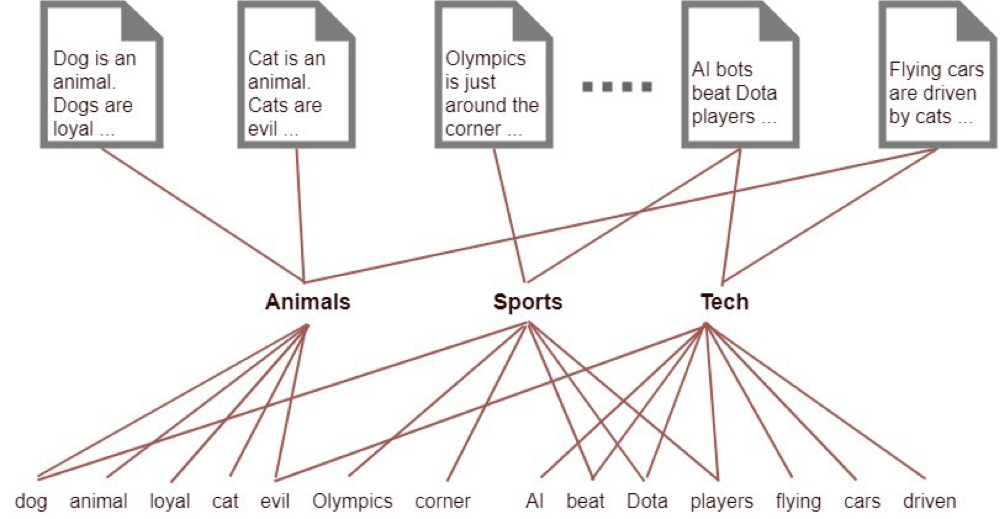

In [29]:
display(Image(filename='C:/Users/hasan/Documents/development/tm/lab_sessions/lab6/images/topic-model2.png'))


Analyzing the Naive Bayes Classifier with ROBERTA against the BERT model: 

- When comparing the accuracy of both models we see that the BERT model has a slightly higher accuracy than the Naive Bayes model with a negligible difference of only 0.2.
- If we look at the precision and recall of the individual classes we see that for the class 0 and 3 the Naive Bayes has a higher F1-score. However, if we look at the precision and recall individually we see that the Naive Bayes has a lower precision for the 0 class but a higher recall, whereas for class 3 it has a higher precision and a lower recall compared to the BERT model. 
- As for the classes 1 and 2, we see that the BERT model has an overall better performance when it comes to all of the metrics even though some of the differences are not that high. 
- In conclusion, both models performed well maybe with a slight advantage for the BERT model. 